In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import ast
import json
from collections import Counter

plt.rcParams['figure.figsize'] = (10,6)
plt.rcParams['font.size'] = 12

# Load outputs
csv_path = "results_test/species_timeseries.csv"
json_path = "results_test/fragments.json"
type_map_path = "type_map.json"

df = pd.read_csv(csv_path)

with open(json_path) as f:
    fragments_info = json.load(f)

with open(type_map_path) as f:
    type_map = json.load(f)

time = df["timestep"].values

species_cols = df.columns[1:]

In [2]:
#1. Convert fragment tuples → chemical formulas
def fragment_to_formula(key, type_map):
    """
    Convert "(1,1,6,8)" to "C2O1Li1", etc.
    """
    types = ast.literal_eval(key)
    counts = Counter(type_map[str(t)] for t in types)

    # Return alphabetical formula, e.g. C2H4O3
    return "".join(
        f"{elem}{counts[elem] if counts[elem] > 1 else ''}"
        for elem in sorted(counts)
    )

formula_map = {k: fragment_to_formula(k, type_map) for k in species_cols}

df.rename(columns=formula_map, inplace=True)
species_cols = df.columns[1:]

In [3]:
#2. Identify dominant species
total_counts = df[species_cols].sum().sort_values(ascending=False)
topN = total_counts.index[:10]  # top 10
topN

Index(['C3H4O3', 'H', 'Li', 'O', 'F6P', 'C3H3O3', 'C3H4O2', 'C2H4O', 'CO2',
       'CH2O'],
      dtype='object')

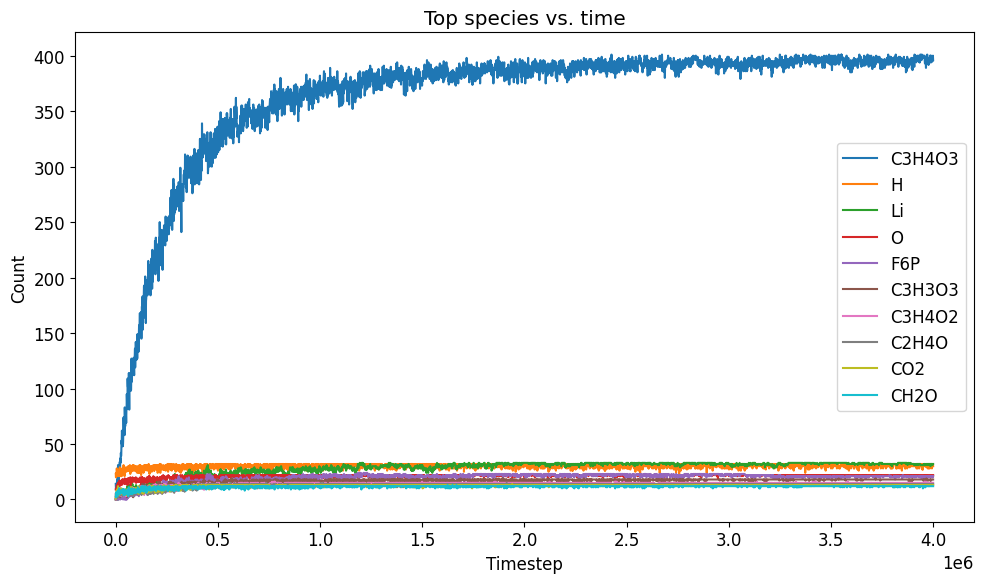

In [4]:
#3. Plot time evolution of top species
plt.figure()
for sp in topN:
    plt.plot(time, df[sp], label=sp)

plt.xlabel("Timestep")
plt.ylabel("Count")
plt.title("Top species vs. time")
plt.legend()
plt.tight_layout()
plt.show()

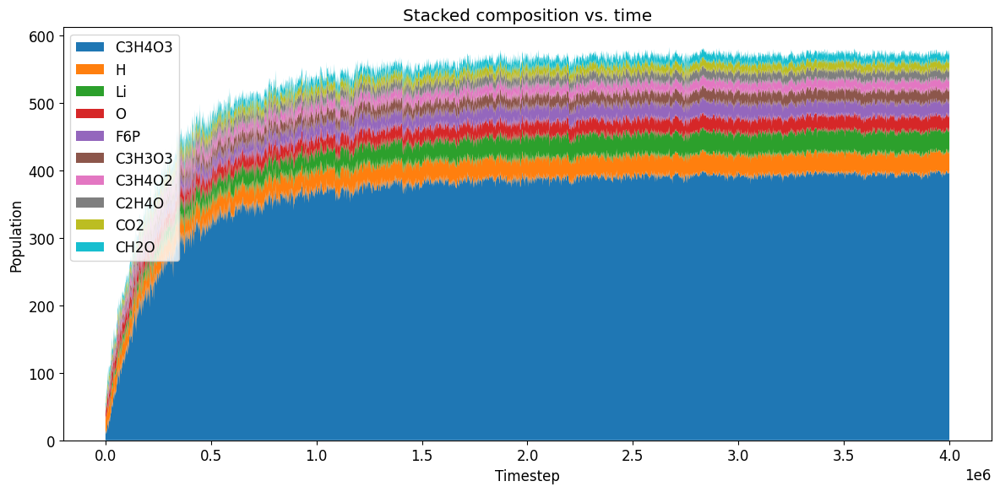

In [5]:
#4. Stacked area plot
plt.figure(figsize=(12,6))
plt.stackplot(time, df[topN].T, labels=topN)
plt.xlabel("Timestep")
plt.ylabel("Population")
plt.title("Stacked composition vs. time")
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


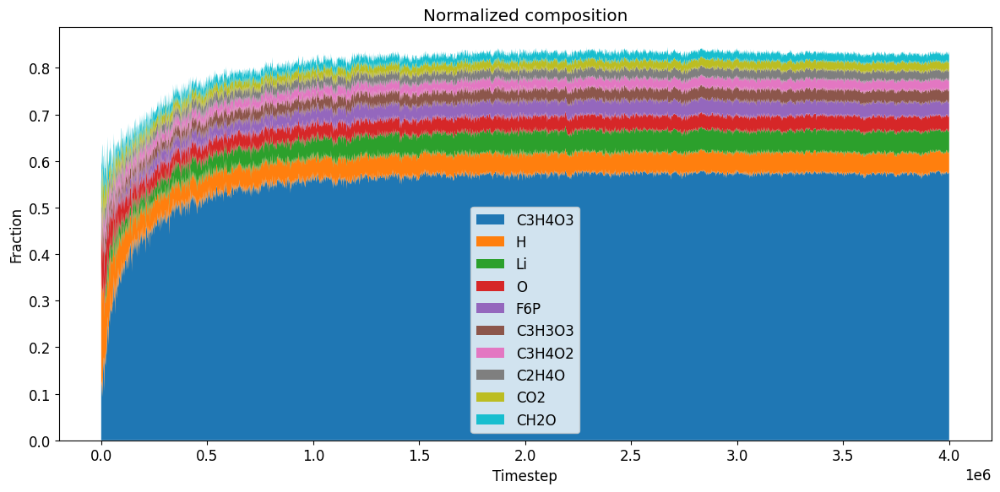

In [6]:
#5. Normalized system composition (fractions)
df_frac = df.copy()
df_frac[species_cols] = df_frac[species_cols].div(df_frac[species_cols].sum(axis=1), axis=0)

plt.figure(figsize=(12,6))
plt.stackplot(time, df_frac[topN].T)
plt.xlabel("Timestep")
plt.ylabel("Fraction")
plt.title("Normalized composition")
plt.legend(topN)
plt.tight_layout()
plt.show()


In [10]:
#6. Species lifetime histogram
#A species is “alive” whenever its count > 0.
lifetimes = {}
for sp in species_cols:
    active = (df[sp] > 0).astype(int)
    # Count consecutive runs > 0
    runs = []
    run = 0
    for a in active:
        if a == 1:
            run += 1
        elif run > 0:
            runs.append(run)
            run = 0
    if run > 0:
        runs.append(run)
    if len(runs):
        lifetimes[sp] = max(runs)

plt.figure(figsize=(8, len(lifetimes) * 0.4))   # auto height scaling
plt.barh(list(lifetimes.keys()), list(lifetimes.values()))
plt.xlabel("Lifetime (frames)")
plt.title("Species max lifetime")

plt.xticks(fontsize=12)
plt.yticks(fontsize=8)   # smaller labels

plt.tight_layout()
plt.show()


In [11]:
sorted_L = dict(sorted(lifetimes.items(), key=lambda x: x[1], reverse=True))

plt.figure(figsize=(8, len(sorted_L)*0.4))
plt.barh(list(sorted_L.keys()), list(sorted_L.values()))
plt.xlabel("Lifetime (frames)")
plt.title("Species max lifetime")
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

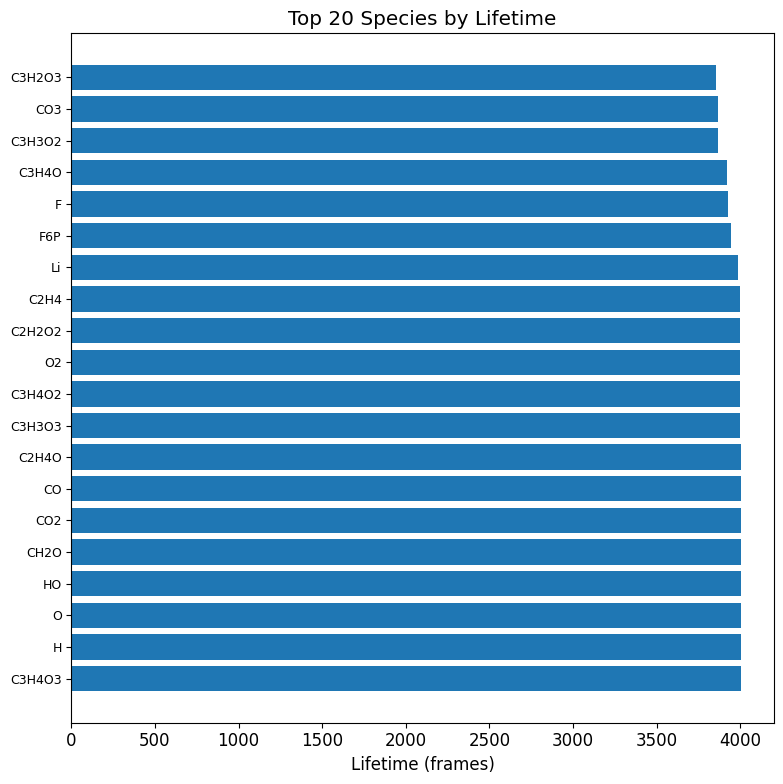

In [15]:
N = 20
top_L = dict(sorted(lifetimes.items(), key=lambda x: x[1], reverse=True)[:N])

plt.figure(figsize=(8, N*0.4))
plt.barh(list(top_L.keys()), list(top_L.values()))
plt.xlabel("Lifetime (frames)")
plt.title(f"Top {N} Species by Lifetime")
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()

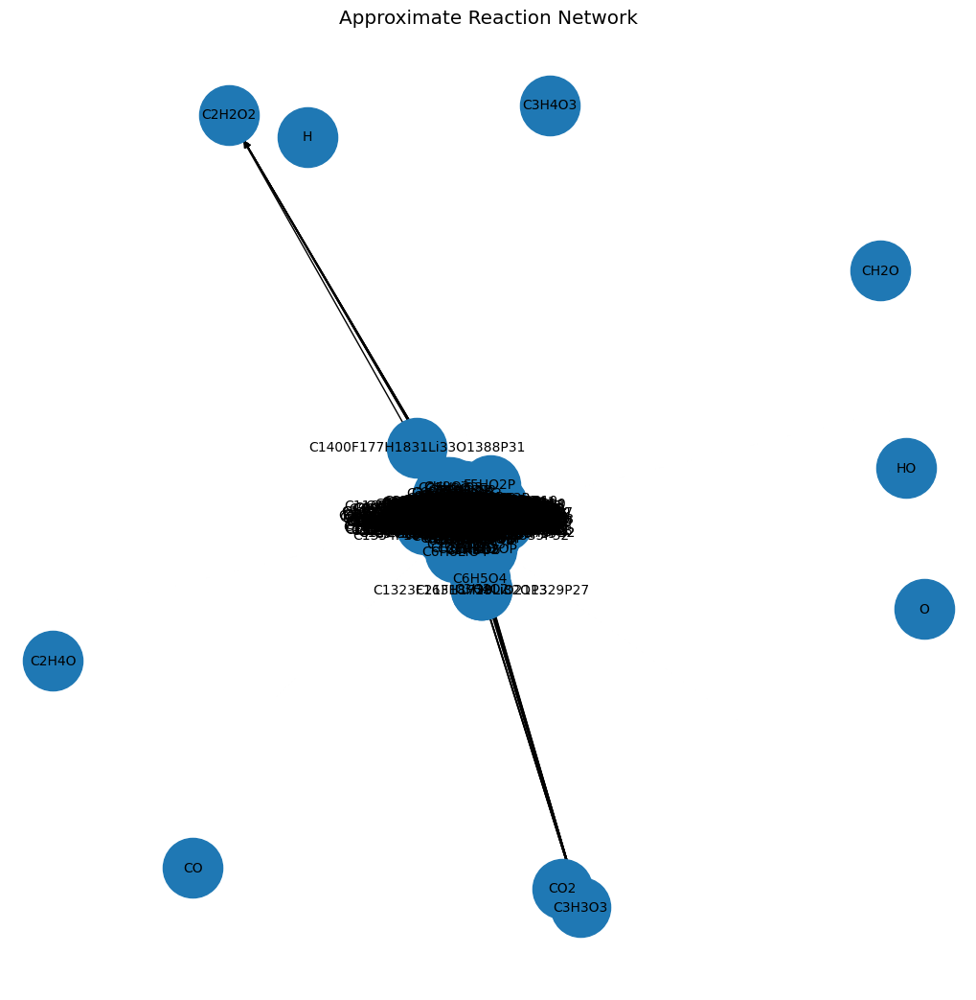

In [16]:
#7. Reaction network (optional, requires networkx)
#Defines an edge when a species appears right after another disappears.

import networkx as nx

G = nx.DiGraph()

for sp in species_cols:
    G.add_node(sp)

# Simple appearance/disappearance heuristic
for i in range(1, len(df)):
    prev = df.iloc[i-1][species_cols] > 0
    curr = df.iloc[i][species_cols] > 0

    died = prev & (~curr)
    born = (~prev) & curr

    for d in died[died].index:
        for b in born[born].index:
            G.add_edge(d, b)

plt.figure(figsize=(10,10))
pos = nx.spring_layout(G, seed=0)
nx.draw(G, pos, with_labels=True, node_size=2000, font_size=10)
plt.title("Approximate Reaction Network")
plt.show()

In [ ]:
def shorten(label, maxlen=12):
    return label if len(label) <= maxlen else label[:maxlen] + "…"

short_labels = {n: shorten(n) for n in G.nodes()}

plt.figure(figsize=(18, 18))

pos = nx.spring_layout(G, k=5.0, iterations=300, seed=0)

nx.draw(G, pos,
        labels=short_labels,
        node_size=2600,
        font_size=11)

plt.title("Reaction Network")
plt.show()

KeyboardInterrupt: 